In [ ]:
!pip install filetype

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import os
import gdown
from zipfile import ZipFile
import pandas as pd
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
import seaborn as sns
import torch
from natsort import natsorted
from PIL import Image
from torch.utils.data import Dataset
from torchvision import transforms
import cv2
import filetype



# Nueva manera de cargar **celeb a dataset**

In [ ]:
dir = "celeba"

In [ ]:
'''try:
  os.makedirs(dir)
except Exception as e:
  pass

url = "https://drive.google.com/uc?id=1O7m1010EJjLE5QxLZiM9Fpjs7Oj6e684"
#url = 'https://drive.google.com/uc?id=1cNIac61PSA_LqDFYFUeyaQYekYPc75NH'
output = "celeba/data.zip"
gdown.download(url, output, quiet=True)'''

'try:\n  os.makedirs(dir)\nexcept Exception as e:\n  pass\n\nurl = "https://drive.google.com/uc?id=1O7m1010EJjLE5QxLZiM9Fpjs7Oj6e684"\n#url = \'https://drive.google.com/uc?id=1cNIac61PSA_LqDFYFUeyaQYekYPc75NH\'\noutput = "celeba/data.zip"\ngdown.download(url, output, quiet=True)'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
dir="/content/drive/MyDrive/TFG/"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
dir_output_local = r"/content/celeba/"
with ZipFile('/content/drive/MyDrive/TFG/celeba/img_align_celeba/img_align_celeba.zip', "r") as zipobj:
    zipobj.extractall(dir_output_local)

In [ ]:
def get_annotation(fnmtxt, verbose=True):
  if verbose:
      print("_" * 70)
      #print(dir +"/"+ fnmtxt)

  #rfile = open(dir+"/"+fnmtxt, 'r')
  rfile = open(fnmtxt, 'r')
  texts = rfile.read().split("\n")
  rfile.close()

  columns = np.array(texts[1].split(" "))
  columns = columns[columns != ""]
  df = []
  for txt in texts[2:]:
      txt = np.array(txt.split(" "))
      txt = txt[txt != ""]

      df.append(txt)

  df = pd.DataFrame(df)

  if df.shape[1] == len(columns) + 1:
      columns = ["image_id"] + list(columns)
  df.columns = columns
  df = df.dropna()
  if verbose:
      print(" Total number of annotations {}\n".format(df.shape))
      print(df.head())
  ## cast to integer
  for nm in df.columns:
      if nm != "image_id":
          df[nm] = pd.to_numeric(df[nm], downcast="float")
  return (df)

attr   = get_annotation(dir+"list_attr_celeba.txt")
align  = get_annotation(dir+"list_landmarks_align_celeba.txt")

#assert np.all(align["image_id"] == attr["image_id"])

______________________________________________________________________
 Total number of annotations (202599, 41)

     image_id 5_o_Clock_Shadow Arched_Eyebrows Attractive Bags_Under_Eyes  \
0  000001.jpg               -1               1          1              -1   
1  000002.jpg               -1              -1         -1               1   
2  000003.jpg               -1              -1         -1              -1   
3  000004.jpg               -1              -1          1              -1   
4  000005.jpg               -1               1          1              -1   

  Bald Bangs Big_Lips Big_Nose Black_Hair  ... Sideburns Smiling  \
0   -1    -1       -1       -1         -1  ...        -1       1   
1   -1    -1       -1        1         -1  ...        -1       1   
2   -1    -1        1       -1         -1  ...        -1      -1   
3   -1    -1       -1       -1         -1  ...        -1      -1   
4   -1    -1        1       -1         -1  ...        -1      -1   

  Straight_Hai

In [ ]:
attr

,image_id,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
0,000001.jpg,-1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,...,-1.0,1.0,1.0,-1.0,1.0,-1.0,1.0,-1.0,-1.0,1.0
1,000002.jpg,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,...,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0
2,000003.jpg,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0
3,000004.jpg,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,...,-1.0,-1.0,1.0,-1.0,1.0,-1.0,1.0,1.0,-1.0,1.0
4,000005.jpg,-1.0,1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202594,202595.jpg,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,1.0
202595,202596.jpg,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0,-1.0,...,-1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0
202596,202597.jpg,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,...,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0
202597,202598.jpg,-1.0,1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,1.0,...,-1.0,1.0,-1.0,1.0,1.0,-1.0,1.0,-1.0,-1.0,1.0


In [ ]:
align

,image_id,lefteye_x,lefteye_y,righteye_x,righteye_y,nose_x,nose_y,leftmouth_x,leftmouth_y,rightmouth_x,rightmouth_y
0,000001.jpg,69.0,109.0,106.0,113.0,77.0,142.0,73.0,152.0,108.0,154.0
1,000002.jpg,69.0,110.0,107.0,112.0,81.0,135.0,70.0,151.0,108.0,153.0
2,000003.jpg,76.0,112.0,104.0,106.0,108.0,128.0,74.0,156.0,98.0,158.0
3,000004.jpg,72.0,113.0,108.0,108.0,101.0,138.0,71.0,155.0,101.0,151.0
4,000005.jpg,66.0,114.0,112.0,112.0,86.0,119.0,71.0,147.0,104.0,150.0
...,...,...,...,...,...,...,...,...,...,...,...
202594,202595.jpg,69.0,111.0,108.0,111.0,89.0,140.0,73.0,151.0,104.0,153.0
202595,202596.jpg,67.0,112.0,110.0,112.0,85.0,141.0,66.0,150.0,110.0,150.0
202596,202597.jpg,69.0,111.0,107.0,111.0,92.0,137.0,68.0,151.0,109.0,153.0
202597,202598.jpg,69.0,111.0,108.0,111.0,90.0,137.0,71.0,153.0,106.0,151.0


In [ ]:
dir_data = "celeba/img_align_celeba/"

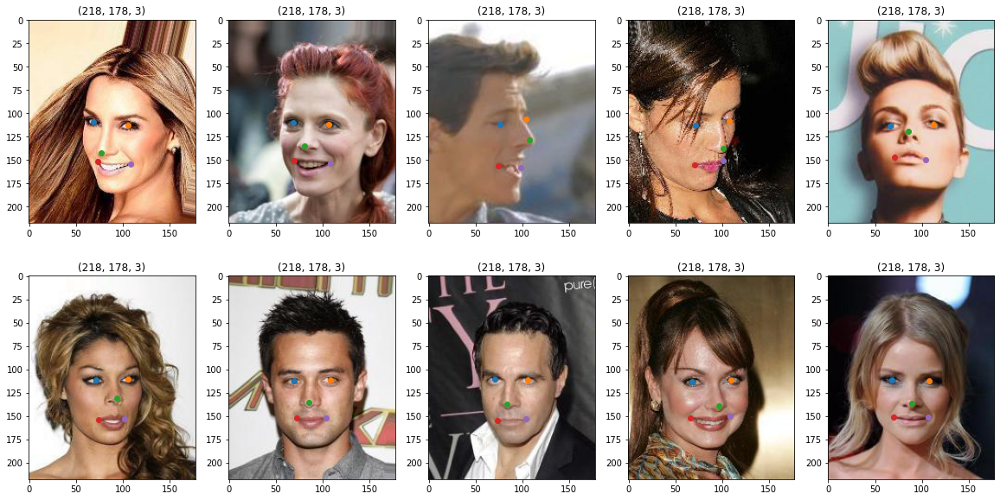

In [ ]:
def plot_image(align,nrow=2):
    figsize = (20,10)
    ncol = 5
    fig = plt.figure(figsize=figsize)
    N = nrow*ncol
    for i, myid in enumerate(align["image_id"][:N]):
        image = load_img(dir_data + "/" + myid)
        image = img_to_array(image)/255.0

        (_, 
         lefteye_x,    lefteye_y,
         righteye_x,   righteye_y, 
         nose_x,       nose_y,
         leftmouth_x,  leftmouth_y, 
         rightmouth_x, rightmouth_y) = align.iloc[i]


        ax  = fig.add_subplot(nrow,ncol,i+1)
        ax.imshow(image)
        ax.set_title(image.shape)
        ax.scatter(lefteye_x,    lefteye_y)
        ax.scatter(righteye_x,   righteye_y)
        ax.scatter(nose_x,       nose_y)
        ax.scatter(leftmouth_x,  leftmouth_y)
        ax.scatter(rightmouth_x, rightmouth_y)
plot_image(align)

In [ ]:
attr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 202599 entries, 0 to 202598
Data columns (total 41 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   image_id             202599 non-null  object 
 1   5_o_Clock_Shadow     202599 non-null  float32
 2   Arched_Eyebrows      202599 non-null  float32
 3   Attractive           202599 non-null  float32
 4   Bags_Under_Eyes      202599 non-null  float32
 5   Bald                 202599 non-null  float32
 6   Bangs                202599 non-null  float32
 7   Big_Lips             202599 non-null  float32
 8   Big_Nose             202599 non-null  float32
 9   Black_Hair           202599 non-null  float32
 10  Blond_Hair           202599 non-null  float32
 11  Blurry               202599 non-null  float32
 12  Brown_Hair           202599 non-null  float32
 13  Bushy_Eyebrows       202599 non-null  float32
 14  Chubby               202599 non-null  float32
 15  Double_Chin      

In [ ]:
list_percentages = [] 
cols_att =[]
d = pd.DataFrame()
for colnm in attr.columns:
    if colnm != "image_id":
        print(" {:20} {:5.2f}%".format(
                colnm,100*np.mean(attr[colnm] == 1)))
        
        cols_att.append(colnm)
        list_percentages.append(100*np.mean(attr[colnm] == 1))

        new_row={"name":colnm, "perc":100*np.mean(attr[colnm] == 1)}

        d.append(new_row, ignore_index=True)

 5_o_Clock_Shadow     11.11%
 Arched_Eyebrows      26.70%
 Attractive           51.25%
 Bags_Under_Eyes      20.46%
 Bald                  2.24%
 Bangs                15.16%
 Big_Lips             24.08%
 Big_Nose             23.45%
 Black_Hair           23.93%
 Blond_Hair           14.80%
 Blurry                5.09%
 Brown_Hair           20.52%
 Bushy_Eyebrows       14.22%
 Chubby                5.76%
 Double_Chin           4.67%
 Eyeglasses            6.51%
 Goatee                6.28%
 Gray_Hair             4.19%
 Heavy_Makeup         38.69%
 High_Cheekbones      45.50%
 Male                 41.68%
 Mouth_Slightly_Open  48.34%
 Mustache              4.15%
 Narrow_Eyes          11.51%
 No_Beard             83.49%
 Oval_Face            28.41%
 Pale_Skin             4.29%
 Pointy_Nose          27.74%
 Receding_Hairline     7.98%
 Rosy_Cheeks           6.57%
 Sideburns             5.65%
 Smiling              48.21%
 Straight_Hair        20.84%
 Wavy_Hair            31.96%
 Wearing_Earri

In [ ]:
d=pd.DataFrame(zip(cols_att,list_percentages), columns = ["name", "p"])
d

,name,p
0,5_o_Clock_Shadow,11.113579
1,Arched_Eyebrows,26.698059
2,Attractive,51.250500
3,Bags_Under_Eyes,20.457159
4,Bald,2.244335
5,Bangs,15.157528
6,Big_Lips,24.079586
7,Big_Nose,23.453225
8,Black_Hair,23.925093
9,Blond_Hair,14.799185


In [ ]:
d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40 entries, 0 to 39
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   name    40 non-null     object 
 1   p       40 non-null     float64
dtypes: float64(1), object(1)
memory usage: 768.0+ bytes


In [ ]:
d=d.sort_values(by=['p'], ascending=False)

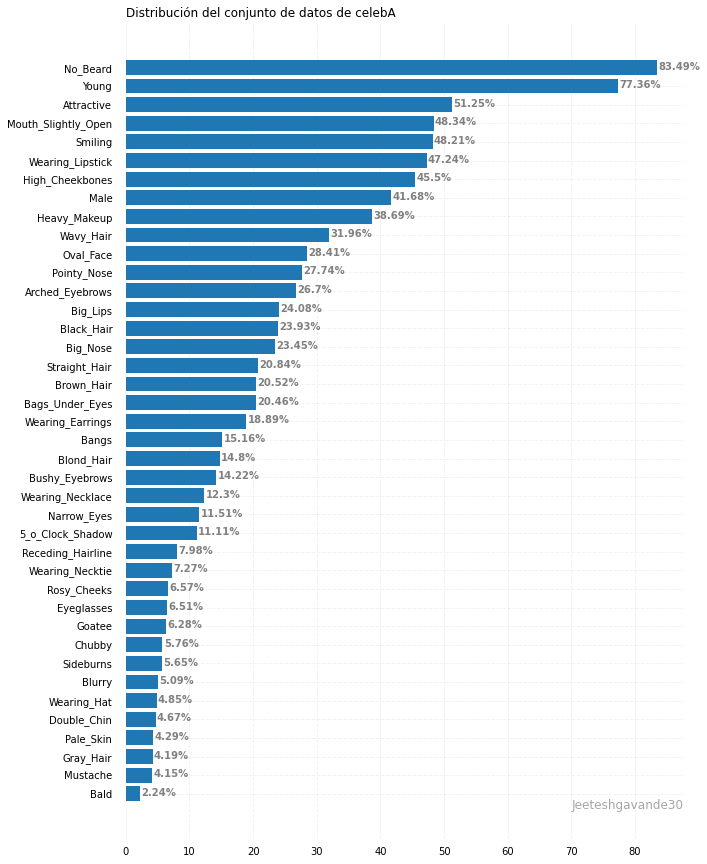

In [ ]:

import pandas as pd
from matplotlib import pyplot as plt
 
# Read CSV into pandas
 
name = d['name']
price = d['p']
 
# Figure Size
fig, ax = plt.subplots(figsize =(10, 15))
 
# Horizontal Bar Plot
ax.barh(name, price)
 
# Remove axes splines
for s in ['top', 'bottom', 'left', 'right']:
    ax.spines[s].set_visible(False)
 
# Remove x, y Ticks
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')
 
# Add padding between axes and labels
ax.xaxis.set_tick_params(pad = 5)
ax.yaxis.set_tick_params(pad = 10)
 
# Add x, y gridlines
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.5,
        alpha = 0.2)
 
# Show top values
ax.invert_yaxis()
 
# Add annotation to bars
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2))+"%",
             fontsize = 10, fontweight ='bold',
             color ='grey')
 
# Add Plot Title
ax.set_title('Distribución del conjunto de datos de celebA ',
             loc ='left', )
 
# Add Text watermark
fig.text(0.9, 0.15, 'Jeeteshgavande30', fontsize = 12,
         color ='grey', ha ='right', va ='bottom',
         alpha = 0.7)
 
# Show Plot
plt.show()

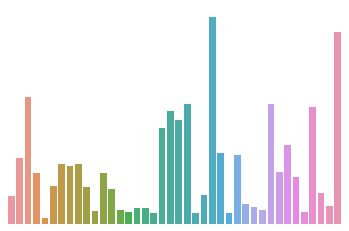

In [ ]:
ax = sns.barplot(x=np.arange(len(cols_att)), y=list_percentages)
ax.bar_label(ax.containers[0])
plt.axis('off')
plt.show()

Smiling


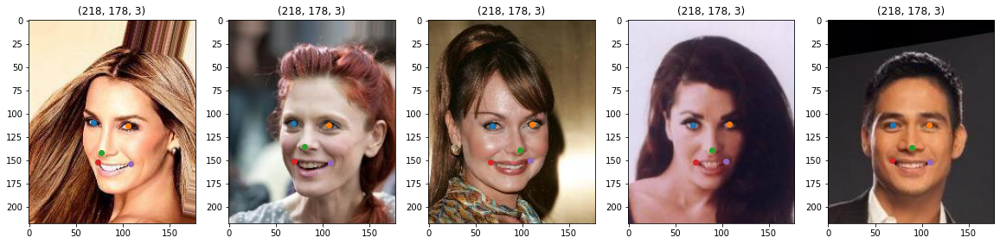

Male


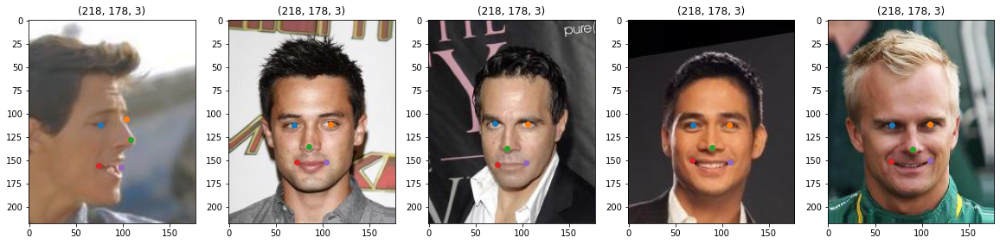

Eyeglasses


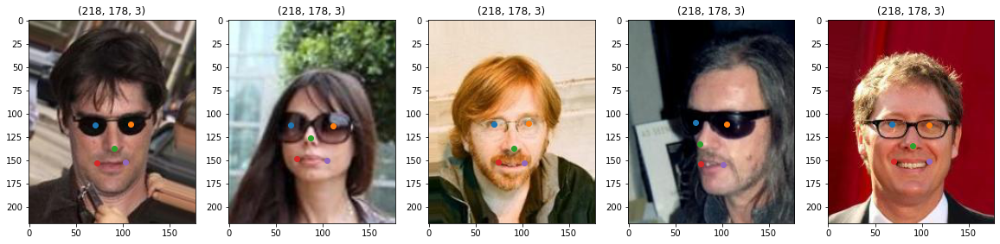

Bald


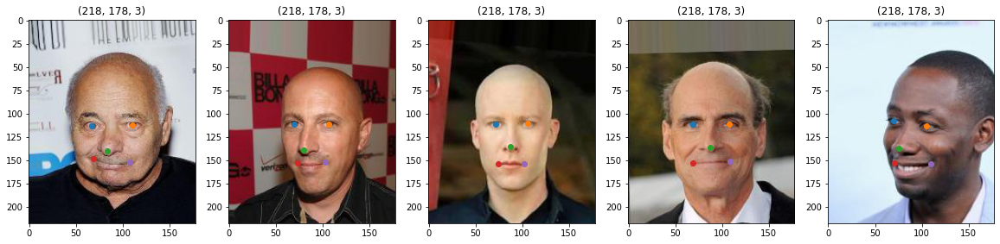

<Figure size 432x288 with 0 Axes>

In [ ]:
for attrnm in ["Smiling", "Male", "Eyeglasses", "Bald" ]:
    print(attrnm)
    plot_image(align.loc[attr[attrnm] == 1,:],nrow=1)
    plt.show()
plt.savefig('celeba_many.png')

Blond_Hair


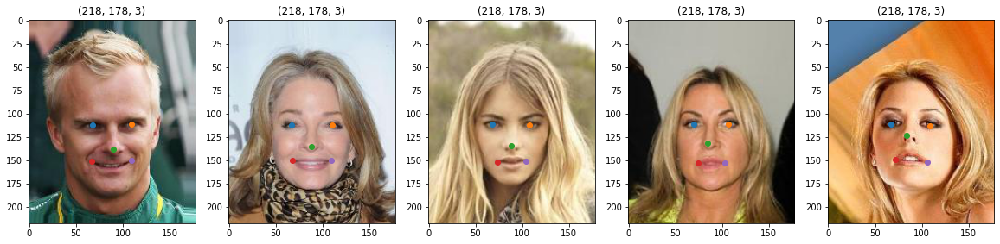

Brown_Hair


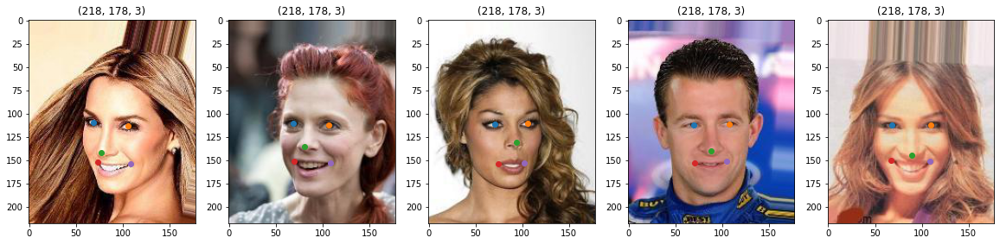

Gray_Hair


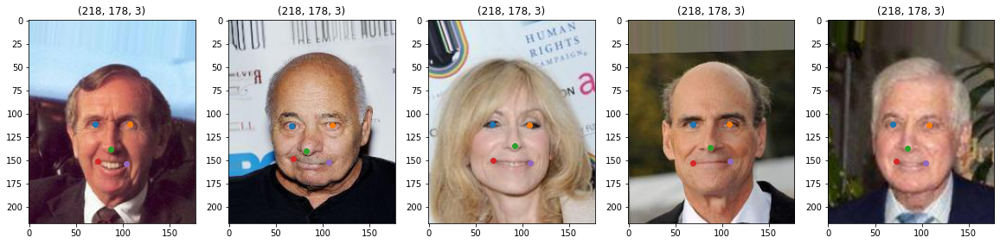

Black_Hair


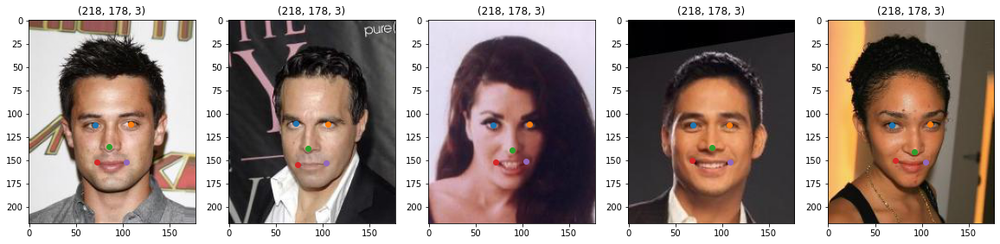

In [ ]:
for attrnm in [ "Blond_Hair","Brown_Hair", "Gray_Hair", "Black_Hair" ]:
    print(attrnm)
    plot_image(align.loc[attr[attrnm] == 1,:],nrow=1)
    plt.show()

In [ ]:
for attrnm in ["Blond_Hair","Black_Hair", "Brown_Hair","Young","Bald","Male","Eyeglasses"]:
    print(attrnm)
    plot_image(align.loc[attr[attrnm] == 1,:],nrow=1)
    plt.show()

Blond_Hair


NameError: ignored

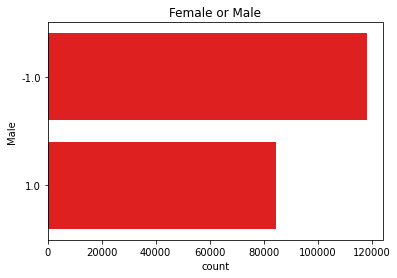

In [ ]:
plt.title('Female or Male')
sns.countplot(y='Male', data=attr, color="r")
plt.show()

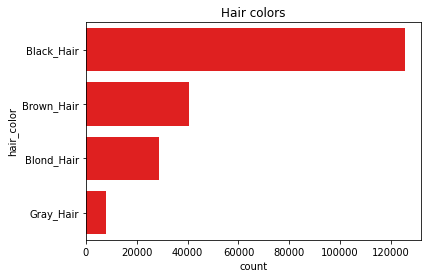

In [ ]:
attr['hair_color'] = pd.get_dummies(attr[['Black_Hair', 'Brown_Hair', 'Blond_Hair', 'Gray_Hair']]).idxmax(1)
sns.countplot(y='hair_color', data=attr, color="r", order = attr['hair_color'].value_counts().index)
plt.title('Hair colors')
plt.show()

In [ ]:
plt.title('Female or Male')
sns.countplot(y='Male', data=attr, color="r")
plt.show()

In [ ]:
attr

,image_id,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,Blond_Hair,Blurry,Brown_Hair,Bushy_Eyebrows,Chubby,Double_Chin,Eyeglasses,Goatee,Gray_Hair,Heavy_Makeup,High_Cheekbones,Male,Mouth_Slightly_Open,Mustache,Narrow_Eyes,No_Beard,Oval_Face,Pale_Skin,Pointy_Nose,Receding_Hairline,Rosy_Cheeks,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
0,000001.jpg,-1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0,1.0,-1.0,1.0,-1.0,-1.0,1.0
1,000002.jpg,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0
2,000003.jpg,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0
3,000004.jpg,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,1.0,-1.0,1.0,1.0,-1.0,1.0
4,000005.jpg,-1.0,1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202594,202595.jpg,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,1.0
202595,202596.jpg,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0
202596,202597.jpg,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0
202597,202598.jpg,-1.0,1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0,1.0,-1.0,1.0,-1.0,1.0,-1.0,1.0,1.0,-1.0,1.0,-1.0,-1.0,1.0


# Guardado con Pickle

In [ ]:
import pickle


with open('celeba_annotations_attr.pickle', 'wb') as output:
    pickle.dump(attr, output)
  
with open('celeba_annotations_align.pickle', 'wb') as output:
    pickle.dump(align, output)

In [ ]:
with open('celeba_annotations_attr.pickle', 'rb') as data:
    dataset = pickle.load(data)

with open('celeba_annotations_align.pickle', 'rb') as data:
    dataset = pickle.load(data)

# Guardado con Numpy Savez (Más rápido)

In [ ]:
np.savez_compressed('celeba_annotations', attr=attr.values, attr_col = attr.columns, align=align.values, align_col = align.columns)

In [ ]:
celeba_annotations = np.load('./celeba/celeba_annotations.npz', allow_pickle=True)

In [ ]:
celeba_annotations

In [ ]:
attr_col = celeba_annotations['attr_col']
align_col = celeba_annotations['align_col']

In [ ]:
attr_col

array(['image_id', '5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive',
       'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose',
       'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair',
       'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee',
       'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Male',
       'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard',
       'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline',
       'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair',
       'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick',
       'Wearing_Necklace', 'Wearing_Necktie', 'Young'], dtype=object)

In [ ]:
celeba_annotations_age = np.load('./celeba/estimated_ages_with_image_id.npz', allow_pickle=True)

In [ ]:
celeba_annotations_age

In [ ]:
len(celeba_annotations_age)

1

In [ ]:
len(celeba_annotations_age['arr_0'])

22975

In [ ]:
celeba_annotations_age['arr_0'][-1]

array(['022975.jpg', '34'], dtype='<U10')

In [ ]:
celeba_annotations_age = np.load('./celeba/estimated_ages_with_image_id.npz', allow_pickle=True)

array(['022974.jpg', '30'], dtype='<U10')

# Age prediction on the dataset


In [ ]:
! pip install deepface

     |████████████████████████████████| 62 kB 908 kB/s 
     |████████████████████████████████| 2.3 MB 9.6 MB/s 


In [ ]:
from deepface import DeepFace

Directory  /root /.deepface created
Directory  /root /.deepface/weights created


In [ ]:
obj = DeepFace.analyze(img_path="/content/IMG_1477_3.jpg", actions = ['age', 'gender'])

age_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/age_model_weights.h5
To: /root/.deepface/weights/age_model_weights.h5
100%|██████████| 539M/539M [00:07<00:00, 73.6MB/s]


gender_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/gender_model_weights.h5
To: /root/.deepface/weights/gender_model_weights.h5
100%|██████████| 537M/537M [00:08<00:00, 60.8MB/s]
Action: gender: 100%|██████████| 2/2 [00:10<00:00,  5.19s/it]


In [ ]:
obj

{'age': 32,
 'gender': 'Woman',
 'region': {'h': 440, 'w': 440, 'x': 470, 'y': 270}}

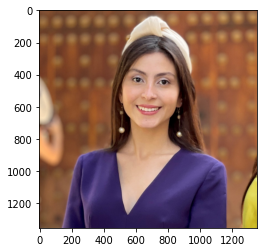

In [ ]:
img = load_img("/content/IMG_1477_3.jpg")
plt.imshow(img)

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s]


{'age': 31, 'region': {'x': 34, 'y': 68, 'w': 110, 'h': 110}, 'gender': 'Woman'}


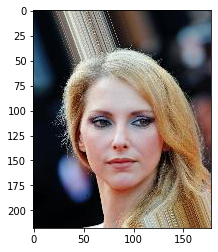

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s]


{'age': 39, 'region': {'x': 40, 'y': 74, 'w': 102, 'h': 102}, 'gender': 'Man'}


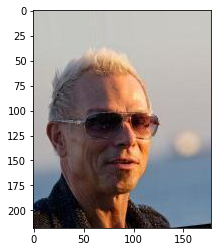

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s]


{'age': 25, 'region': {'x': 39, 'y': 72, 'w': 101, 'h': 101}, 'gender': 'Man'}


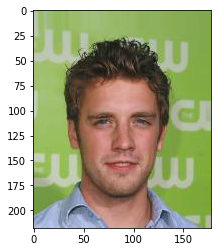

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.66it/s]


{'age': 31, 'region': {'x': 34, 'y': 68, 'w': 109, 'h': 109}, 'gender': 'Woman'}


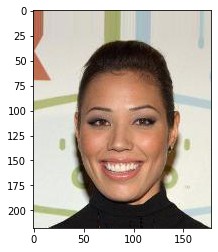

Action: gender: 100%|██████████| 2/2 [00:01<00:00,  1.59it/s]


{'age': 31, 'region': {'x': 35, 'y': 70, 'w': 109, 'h': 109}, 'gender': 'Man'}


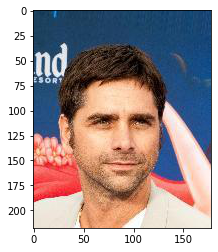

In [ ]:
M = 200
N = 205
for i, myid in enumerate(align["image_id"][M:N]):
    #image = load_img(dir_data + "/" + myid)
    #image = img_to_array(image)/255.0
    image_dir = dir_data + "/" + myid

    obj = DeepFace.analyze(img_path=image_dir, actions = ['age', 'gender'], enforce_detection=False)
    print(obj)
    image = load_img(image_dir)
    plt.imshow(image)
    plt.show()

In [ ]:
AGE_INTERVALS = [(0, 2), (4, 6), (8, 12), (15, 20),
                 (25, 32), (38, 43), (44, 54), (55, 65), (66,100)]

In [ ]:
type(align["image_id"]), align["image_id"][0]

(pandas.core.series.Series, '000001.jpg')

In [ ]:
attr

,image_id,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,Blond_Hair,Blurry,Brown_Hair,Bushy_Eyebrows,Chubby,Double_Chin,Eyeglasses,Goatee,Gray_Hair,Heavy_Makeup,High_Cheekbones,Male,Mouth_Slightly_Open,Mustache,Narrow_Eyes,No_Beard,Oval_Face,Pale_Skin,Pointy_Nose,Receding_Hairline,Rosy_Cheeks,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
0,000001.jpg,-1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0,1.0,-1.0,1.0,-1.0,-1.0,1.0
1,000002.jpg,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0
2,000003.jpg,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0
3,000004.jpg,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,1.0,-1.0,1.0,1.0,-1.0,1.0
4,000005.jpg,-1.0,1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202594,202595.jpg,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,1.0
202595,202596.jpg,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0
202596,202597.jpg,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0
202597,202598.jpg,-1.0,1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0,1.0,-1.0,1.0,-1.0,1.0,-1.0,1.0,1.0,-1.0,1.0,-1.0,-1.0,1.0


In [ ]:
dir_data = "celeba/img_align_celeba/"
estimated_ages = []
for i, myid in enumerate(align["image_id"]):
    #print(i)
    image_dir = dir_data + "/" + myid

    obj = DeepFace.analyze(img_path=image_dir, actions = ['age'], enforce_detection=False,  prog_bar = False)
    estimated_ages.append((myid,obj['age']))
    #print(obj)
    #print(obj['age'])
    #print(align.loc[align['image_id'] == myid])
print("done.")

In [ ]:
len(estimated_ages)

22975

In [ ]:
np.savez_compressed('estimated_ages_with_image_id', estimated_ages)

In [ ]:
celeba_annotations_age['arr_0'][-1]

array(['022975.jpg', '34'], dtype='<U10')

In [ ]:
estimated_ages = []

In [ ]:
estimated_ages[-1]

('033946.jpg', 31)

In [ ]:
len(estimated_ages)

19734

In [ ]:
int(estimated_ages[-1][0].split(".")[0])

46390

In [ ]:
np.savez_compressed('estimated_ages_with_image_id_2', estimated_ages)

In [ ]:
idx, values = zip(*estimated_ages)

a = pd.Series(values, idx)

In [ ]:
a.columns = ["id","age"]

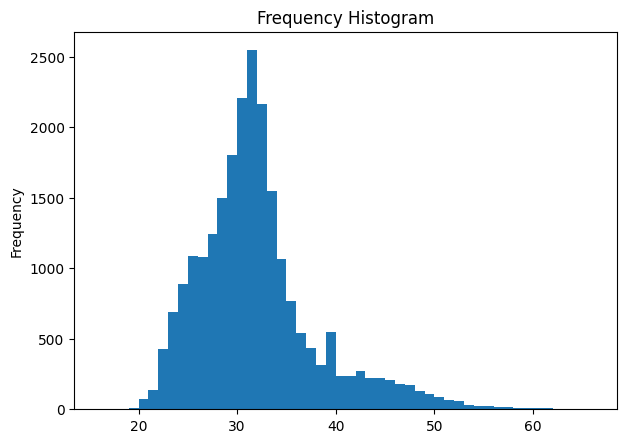

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':100})

# Plot Histogram on x
x = np.random.normal(size = 1000)
plt.hist(a, bins=50)
plt.gca().set(title='Frequency Histogram', ylabel='Frequency');

In [ ]:
min(a), max(a)

(16, 66)

In [ ]:
celeba_annotations_age = np.load('estimated_ages_with_image_id_3.npz', allow_pickle=True)

In [ ]:
estimated_ages = []

In [ ]:
int(celeba_annotations_age['arr_0'][-1][0].split(".")[0])

55048

In [ ]:
M= int(celeba_annotations_age['arr_0'][-1][0].split(".")[0]) +10000

In [ ]:
dir_data = r"celeba/img_align_celeba/"
for i, myid in enumerate(align["image_id"][int(celeba_annotations_age['arr_0'][-1][0].split(".")[0]):M]):
    #print(i)
    image_dir = dir_data + "/" + myid

    obj = DeepFace.analyze(img_path=image_dir, actions = ['age'], enforce_detection=False,  prog_bar = False)
    estimated_ages.append((myid,obj['age']))
    #print(obj)
    #print(obj['age'])
    #print(align.loc[align['image_id'] == myid])
print("done.")

KeyboardInterrupt: ignored

In [ ]:
len(estimated_ages)

2260

In [ ]:
np.savez_compressed('estimated_ages_with_image_id_4', estimated_ages)

In [ ]:
celeba_annotations_age = np.load('estimated_ages_with_image_id_2.npz', allow_pickle=True)

In [ ]:
len(celeba_annotations_age['arr_0'])

23507

In [ ]:
celeba_annotations_age['arr_0'][-1]

array(['046482.jpg', '34'], dtype='<U10')

# Age range


In [ ]:
# define the list of age buckets our age detector will predict
AGE_BUCKETS = ["(0-2)", "(4-6)", "(8-12)", "(15-20)", "(25-32)",
	"(38-43)", "(48-53)", "(60-100)"]

In [ ]:
# download pre-trained model

def download_files(url, output, unzip=False, dir="./"):
  gdown.download(url, output, quiet=True)
  if unzip:
    with ZipFile(output, "r") as zipobj:
      zipobj.extractall(dir)

In [ ]:
try:
  os.makedirs("weights")
except:
  print("Already there or something went wrong.")

# The model pre-trained weights
AGE_PROTO = 'weights/age_deploy.prototxt'
download_files("https://raw.githubusercontent.com/spmallick/learnopencv/master/AgeGender/age_deploy.prototxt", AGE_PROTO)

# The model architecture
# download from: 
AGE_MODEL = 'weights/age_net.caffemodel'
download_files("https://github.com/GilLevi/AgeGenderDeepLearning/raw/master/models/age_net.caffemodel", AGE_MODEL)

Already there or something went wrong.


In [ ]:
# Each Caffe Model impose the shape of the input image also image preprocessing is required like mean
# substraction to eliminate the effect of illunination changes
MODEL_MEAN_VALUES = (78.4263377603, 87.7689143744, 114.895847746)
# Represent the 8 age classes of this CNN probability layer
AGE_INTERVALS = ['(0, 2)', '(4, 6)', '(8, 12)', '(15, 20)',
                 '(25, 32)', '(38, 43)', '(48, 53)', '(60, 100)']
# download from: https://raw.githubusercontent.com/opencv/opencv/master/samples/dnn/face_detector/deploy.prototxt
FACE_PROTO = "weights/deploy.prototxt.txt"
download_files("https://raw.githubusercontent.com/opencv/opencv/master/samples/dnn/face_detector/deploy.prototxt", FACE_PROTO)

# download from: https://raw.githubusercontent.com/opencv/opencv_3rdparty/dnn_samples_face_detector_20180205_fp16/res10_300x300_ssd_iter_140000_fp16.caffemodel
FACE_MODEL = "weights/res10_300x300_ssd_iter_140000_fp16.caffemodel"
download_files("https://raw.githubusercontent.com/opencv/opencv_3rdparty/dnn_samples_face_detector_20180205_fp16/res10_300x300_ssd_iter_140000_fp16.caffemodel", FACE_MODEL)
# Initialize frame size
frame_width = 1280
frame_height = 720
# load face Caffe model
face_net = cv2.dnn.readNet(FACE_PROTO, FACE_MODEL)
# Load age prediction model
age_net = cv2.dnn.readNet("weights/age_deploy.prototxt", "weights/age_net.caffemodel")

In [ ]:
def highlightFace(net, frame, conf_threshold=0.7):
    frameOpencvDnn=frame.copy()
    frameHeight=frameOpencvDnn.shape[0]
    frameWidth=frameOpencvDnn.shape[1]
    blob=cv2.dnn.blobFromImage(frameOpencvDnn, 1.0, (300, 300), [104, 117, 123], True, False)

    net.setInput(blob)
    detections=net.forward()
    faceBoxes=[]
    for i in range(detections.shape[2]):
        confidence=detections[0,0,i,2]
        if confidence>conf_threshold:
            x1=int(detections[0,0,i,3]*frameWidth)
            y1=int(detections[0,0,i,4]*frameHeight)
            x2=int(detections[0,0,i,5]*frameWidth)
            y2=int(detections[0,0,i,6]*frameHeight)
            faceBoxes.append([x1,y1,x2,y2])
            cv2.rectangle(frameOpencvDnn, (x1,y1), (x2,y2), (0,255,0), int(round(frameHeight/150)), 8)
    return frameOpencvDnn,faceBoxes

In [ ]:
# draw each face separately
def draw_faces(img, result_list):


In [ ]:
image_dir = "/content/download.jpg"
image = load_img(image_dir) 

Age: 25, 32 years


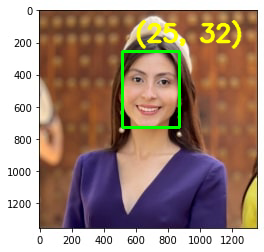

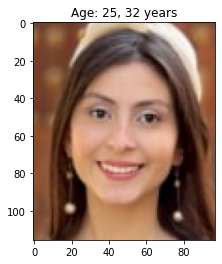

In [ ]:
from google.colab.patches import cv2_imshow

video=cv2.VideoCapture(image_dir if image_dir else 0)
padding=20
while cv2.waitKey(1)<0:
    hasFrame,frame=video.read()
    if not hasFrame:
        cv2.waitKey()
        break

    resultImg,faceBoxes=highlightFace(face_net,frame)
    if not faceBoxes:
        print("No face detected")

    for faceBox in faceBoxes:
        face=frame[max(0,faceBox[1]-padding):
                   min(faceBox[3]+padding,frame.shape[0]-1),max(0,faceBox[0]-padding)
                   :min(faceBox[2]+padding, frame.shape[1]-1)]

        blob=cv2.dnn.blobFromImage(face, 1.0, (227,227), MODEL_MEAN_VALUES, swapRB=False)
        
        age_net.setInput(blob)
        agePreds=age_net.forward()
        age=AGE_INTERVALS[agePreds[0].argmax()]
        print(f'Age: {age[1:-1]} years')

        cv2.putText(resultImg, f' {age}', (faceBox[0], faceBox[1]-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,255,255), 2, cv2.LINE_AA)
        cv2_imshow(resultImg)

        face_rgb = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
        plt.title(f'Age: {age[1:-1]} years')
        plt.imshow(face_rgb)
        # show the plot
        plt.show()

In [ ]:
def highlightFace(net, frame, conf_threshold=0.7):
    frameOpencvDnn=frame.copy()
    frameHeight=frameOpencvDnn.shape[0]
    frameWidth=frameOpencvDnn.shape[1]
    blob=cv2.dnn.blobFromImage(frameOpencvDnn, 1.0, (300, 300), [104, 117, 123], True, False)

    net.setInput(blob)
    detections=net.forward()
    faceBoxes=[]
    for i in range(detections.shape[2]):
        confidence=detections[0,0,i,2]
        if confidence>conf_threshold:
            x1=int(detections[0,0,i,3]*frameWidth)
            y1=int(detections[0,0,i,4]*frameHeight)
            x2=int(detections[0,0,i,5]*frameWidth)
            y2=int(detections[0,0,i,6]*frameHeight)
            faceBoxes.append([x1,y1,x2,y2])
            cv2.rectangle(frameOpencvDnn, (x1,y1), (x2,y2), (0,255,0), int(round(frameHeight/150)), 8)
    return frameOpencvDnn,faceBoxes

Age: 25, 32 years


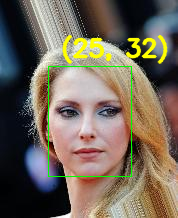

Age: 4, 6 years


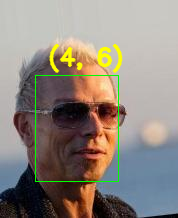

Age: 25, 32 years


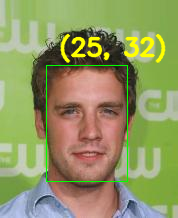

Age: 25, 32 years


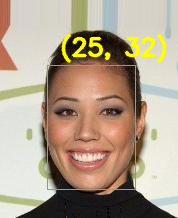

Age: 25, 32 years


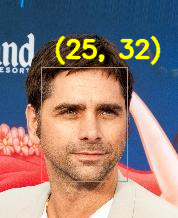

In [ ]:

M = 200
N = 205
for i, myid in enumerate(align["image_id"][M:N]):
    #image = load_img(dir_data + "/" + myid)
    #image = img_to_array(image)/255.0
    image_dir = dir_data + "/" + myid
    image = cv2.imread(image_dir)

    (_, 
    lefteye_x,    lefteye_y,
    righteye_x,   righteye_y, 
    nose_x,       nose_y,
    leftmouth_x,  leftmouth_y, 
    rightmouth_x, rightmouth_y) = align.iloc[i]
    
    resultImg, faceBoxes=highlightFace(face_net,image)
    if not faceBoxes:
        print("No face detected")

    for faceBox in faceBoxes:
        face=frame[max(0,faceBox[1]-padding):
                    min(faceBox[3]+padding,frame.shape[0]-1),max(0,faceBox[0]-padding)
                    :min(faceBox[2]+padding, frame.shape[1]-1)]

        blob=cv2.dnn.blobFromImage(face, 1.0, (227,227), MODEL_MEAN_VALUES, swapRB=False)
        
        age_net.setInput(blob)
        agePreds=age_net.forward()
        age=AGE_INTERVALS[agePreds[0].argmax()]
        print(f'Age: {age[1:-1]} years')

        cv2.putText(resultImg, f' {age}', (faceBox[0], faceBox[1]-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,255,255), 2, cv2.LINE_AA)
        cv2_imshow(resultImg)

        #face_rgb = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
        #plt.title(f'Age: {age[1:-1]} years')
        #plt.imshow(face_rgb)
        # show the plot
        #plt.show()

In [ ]:
from google.colab.patches import cv2_imshow


resultImg,faceBoxes=highlightFace(face_net,frame)
if not faceBoxes:
    print("No face detected")

for faceBox in faceBoxes:
    face=frame[max(0,faceBox[1]-padding):
                min(faceBox[3]+padding,frame.shape[0]-1),max(0,faceBox[0]-padding)
                :min(faceBox[2]+padding, frame.shape[1]-1)]

    blob=cv2.dnn.blobFromImage(face, 1.0, (227,227), MODEL_MEAN_VALUES, swapRB=False)
    
    age_net.setInput(blob)
    agePreds=age_net.forward()
    age=AGE_INTERVALS[agePreds[0].argmax()]
    print(f'Age: {age[1:-1]} years')

    cv2.putText(resultImg, f' {age}', (faceBox[0], faceBox[1]-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,255,255), 2, cv2.LINE_AA)
    cv2_imshow(resultImg)

    face_rgb = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
    plt.title(f'Age: {age[1:-1]} years')
    plt.imshow(face_rgb)
    # show the plot
    plt.show()

In [ ]:
import cv2

In [ ]:
!pip install mtcnn

     |████████████████████████████████| 2.3 MB 5.3 MB/s 


In [ ]:
from mtcnn import MTCNN

In [ ]:
type(img)

PIL.PngImagePlugin.PngImageFile

In [ ]:
img = cv2.cvtColor(cv2.imread("/content/ffhq-dataset/images1024x1024/00000/00040.png"), cv2.COLOR_BGR2RGB)

In [ ]:
detector = MTCNN()
detector.detect_faces(img)

[{'box': [237, 179, 544, 711],
  'confidence': 0.9997766613960266,
  'keypoints': {'left_eye': (386, 482),
   'mouth_left': (401, 720),
   'mouth_right': (625, 715),
   'nose': (507, 626),
   'right_eye': (635, 479)}}]

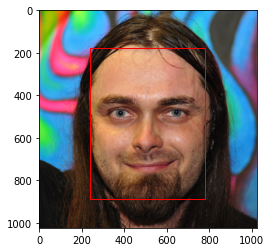

In [ ]:
# face detection with mtcnn on a photograph
from matplotlib import pyplot
from matplotlib.patches import Rectangle
from mtcnn.mtcnn import MTCNN
 
# draw an image with detected objects
def draw_image_with_boxes(img, result_list):
	
	# plot the image
	pyplot.imshow(img)
	# get the context for drawing boxes
	ax = pyplot.gca()
	# plot each box
	for result in result_list:
		# get coordinates
		x, y, width, height = result['box']
		# create the shape
		rect = Rectangle((x, y), width, height, fill=False, color='red')
		# draw the box
		ax.add_patch(rect)
	# show the plot
	pyplot.show()

# detect faces in the image
faces = detector.detect_faces(img)
# display faces on the original image
draw_image_with_boxes(img, faces)

In [ ]:
# draw each face separately
def draw_faces(img, result_list):
	# plot each face as a subplot
	for i in range(len(result_list)):
		# get coordinates
		x1, y1, width, height = result_list[i]['box']
		x2, y2 = x1 + width, y1 + height
		# define subplot
		pyplot.subplot(1, len(result_list), i+1)
		pyplot.axis('off')
		# plot face
		pyplot.imshow(img[y1:y2, x1:x2])
	# show the plot
	pyplot.show()
	return img[y1:y2, x1:x2]

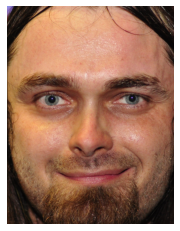

In [ ]:
f = draw_faces(img, faces)

# Flickr-Faces-HQ Dataset (FFHQ)

In [ ]:
# Download the code
!git clone https://github.com/NVlabs/ffhq-dataset.git
%cd ffhq-dataset

Cloning into 'ffhq-dataset'...
remote: Enumerating objects: 67, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 67 (delta 2), reused 4 (delta 2), pack-reused 60
Unpacking objects: 100% (67/67), done.
/content/ffhq-dataset


In [ ]:
#Download training dataset
!python download_ffhq.py --json

- 100.00% done  2/2 files  0.25/0.25 GB   79.46 MB/s  ETA: done    
Parsing JSON metadata...


In [ ]:
!python download_ffhq.py --thumbs

Parsing JSON metadata...
-   0.04% done  25/70001 files  0.00/1.96 GB   0.39 MB/s   ETA: ...     Traceback (most recent call last):
  File "download_ffhq.py", line 84, in download_file
    raise IOError('Incorrect file size', file_path)
OSError: [Errno Incorrect file size] thumbnails128x128/65000/65316.png

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "download_ffhq.py", line 445, in <module>
    run_cmdline(sys.argv)
  File "download_ffhq.py", line 440, in run_cmdline
    run(**vars(args))
  File "download_ffhq.py", line 409, in run
    download_files(specs, **download_kwargs)
  File "download_ffhq.py", line 205, in download_files
    raise exc_info[1].with_traceback(exc_info[2])
  File "download_ffhq.py", line 214, in _download_thread
    download_file(session, spec, stats, **download_kwargs)
  File "download_ffhq.py", line 115, in download_file
    raise IOError("Google Drive download quota exceeded -- please try agai

In [ ]:
!python download_ffhq.py --images

Parsing JSON metadata...
-   2.49% done  1740/70001 files  2.22/89.19 GB  16.20 MB/s  ETA: 1h 31m  Traceback (most recent call last):
  File "download_ffhq.py", line 84, in download_file
    raise IOError('Incorrect file size', file_path)
OSError: [Errno Incorrect file size] images1024x1024/34000/34884.png

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "download_ffhq.py", line 445, in <module>
    run_cmdline(sys.argv)
  File "download_ffhq.py", line 440, in run_cmdline
    run(**vars(args))
  File "download_ffhq.py", line 409, in run
    download_files(specs, **download_kwargs)
  File "download_ffhq.py", line 205, in download_files
    raise exc_info[1].with_traceback(exc_info[2])
  File "download_ffhq.py", line 214, in _download_thread
    download_file(session, spec, stats, **download_kwargs)
  File "download_ffhq.py", line 115, in download_file
    raise IOError("Google Drive download quota exceeded -- please try agai

In [ ]:
!ls

docs		  ffhq-dataset-v2.json	ffhq-teaser.png  LICENSE.txt
download_ffhq.py  ffhq-piecharts.png	images1024x1024  README.md


In [ ]:
img_array = []
for dirname, _, filenames in os.walk('/content/ffhq-dataset/images1024x1024'):
    for filename in filenames:
        #print(os.path.join(dirname, filename))
        _, file_extension = os.path.splitext(filename)
        #print(file_extension)
        if file_extension.endswith(".png"): 
          #print(file_extension)
          img_array.append(os.path.join(dirname, filename))


FileNotFoundError: ignored

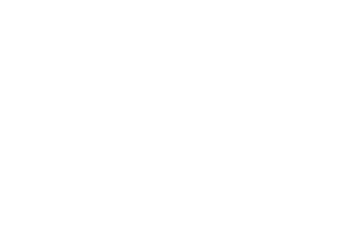

In [ ]:
for x in img_array:
    plt.axis("off")
    img = load_img(x)
    plt.imshow(img)
    break

In [ ]:
len(img_array)

1741

In [ ]:
len(img_array)

1

In [ ]:
# Save images as npz binary files so it's lighter to move and load
np.savez("ffhq_some_large_images.npz",img_array) # save all in one file

In [ ]:
img_array = np.load("/content/ffhq_some_large_images.npz")

In [ ]:
print(img_array)

In [ ]:
img_array, len(img_array)

(<numpy.lib.npyio.NpzFile at 0x7f9d6d01b510>, 1)

In [ ]:
annotations = pd.read_json('ffhq-dataset-v2.json')
annotations

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,69960,69961,69962,69963,69964,69965,69966,69967,69968,69969,69970,69971,69972,69973,69974,69975,69976,69977,69978,69979,69980,69981,69982,69983,69984,69985,69986,69987,69988,69989,69990,69991,69992,69993,69994,69995,69996,69997,69998,69999
category,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,training,...,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation,validation
metadata,{'photo_url': 'https://www.flickr.com/photos/f...,{'photo_url': 'https://www.flickr.com/photos/c...,{'photo_url': 'https://www.flickr.com/photos/f...,{'photo_url': 'https://www.flickr.com/photos/h...,{'photo_url': 'https://www.flickr.com/photos/1...,{'photo_url': 'https://www.flickr.com/photos/b...,{'photo_url': 'https://www.flickr.com/photos/m...,{'photo_url': 'https://www.flickr.com/photos/p...,{'photo_url': 'https://www.flickr.com/photos/r...,{'photo_url': 'https://www.flickr.com/photos/7...,{'photo_url': 'https://www.flickr.com/photos/c...,{'photo_url': 'https://www.flickr.com/photos/m...,{'photo_url': 'https://www.flickr.com/photos/q...,{'photo_url': 'https://www.flickr.com/photos/1...,{'photo_url': 'https://www.flickr.com/photos/d...,{'photo_url': 'https://www.flickr.com/photos/m...,{'photo_url': 'https://www.flickr.com/photos/_...,{'photo_url': 'https://www.flickr.com/photos/p...,{'photo_url': 'https://www.flickr.com/photos/c...,{'photo_url': 'https://www.flickr.com/photos/m...,{'photo_url': 'https://www.flickr.com/photos/a...,{'photo_url': 'https://www.flickr.com/photos/1...,{'photo_url': 'https://www.flickr.com/photos/e...,{'photo_url': 'https://www.flickr.com/photos/o...,{'photo_url': 'https://www.flickr.com/photos/e...,{'photo_url': 'https://www.flickr.com/photos/3...,{'photo_url': 'https://www.flickr.com/photos/d...,{'photo_url': 'https://www.flickr.com/photos/p...,{'photo_url': 'https://www.flickr.com/photos/m...,{'photo_url': 'https://www.flickr.com/photos/p...,{'photo_url': 'https://www.flickr.com/photos/c...,{'photo_url': 'https://www.flickr.com/photos/a...,{'photo_url': 'https://www.flickr.com/photos/m...,{'photo_url': 'https://www.flickr.com/photos/b...,{'photo_url': 'https://www.flickr.com/photos/u...,{'photo_url': 'https://www.flickr.com/photos/p...,{'photo_url': 'https://www.flickr.com/photos/j...,{'photo_url': 'https://www.flickr.com/photos/a...,{'photo_url': 'https://www.flickr.com/photos/j...,{'photo_url': 'https://www.flickr.com/photos/a...,...,{'photo_url': 'https://www.flickr.com/photos/w...,{'photo_url': 'https://www.flickr.com/photos/b...,{'photo_url': 'https://www.flickr.com/photos/b...,{'photo_url': 'https://www.flickr.com/photos/w...,{'photo_url': 'https://www.flickr.com/photos/m...,{'photo_url': 'https://www.flickr.com/photos/r...,{'photo_url': 'https://www.flickr.com/photos/1...,{'photo_url': 'https://www.flickr.com/photos/8...,{'photo_url': 'https://www.flickr.com/photos/s...,{'photo_url': 'https://www.flickr.com/photos/j...,{'photo_url': 'https://www.flickr.com/photos/1...,{'photo_url': 'https://www.flickr.com/photos/t...,{'photo_url': 'https://www.flickr.com/photos/l...,{'photo_url': 'https://www.flickr.com/photos/b...,{'photo_url': 'https://www.flickr.com/photos/s...,{'photo_url': 'https://www.flickr.com/photos/o...,{'photo_url': 'http

In [ ]:
annotations[0]

category                                                training
metadata       {'photo_url': 'https://www.flickr.com/photos/f...
image          {'file_url': 'https://drive.google.com/uc?id=1...
thumbnail      {'file_url': 'https://drive.google.com/uc?id=1...
in_the_wild    {'file_url': 'https://drive.google.com/uc?id=1...
Name: 0, dtype: object

In [ ]:
import json

with open('ffhq-dataset-v2.json') as data_file:    
    data = json.load(data_file)  

In [ ]:
data

{'0': {'category': 'training',
  'image': {'face_landmarks': [[131.62, 453.8],
    [142.86, 535.23],
    [154.31, 612.62],
    [179.63, 687.47],
    [230.76, 747.47],
    [298.2, 788.88],
    [375.17, 817.84],
    [439.1, 848.56],
    [500.96, 856.54],
    [554.19, 843.07],
    [600.26, 811.44],
    [652.7, 781.75],
    [697.13, 734.68],
    [725.95, 676.3],
    [738.9, 612.28],
    [743.77, 547.84],
    [747.8, 484.17],
    [260.97, 406.18],
    [312.64, 375.64],
    [376.4, 361.89],
    [445.68, 367.01],
    [505.27, 387.81],
    [577.73, 393.9],
    [623.7, 380.06],
    [671.61, 376.01],
    [712.94, 390.23],
    [732.19, 425.17],
    [540.58, 472.88],
    [548.15, 499.13],
    [556.6, 523.82],
    [565.7, 551.77],
    [489.04, 612.57],
    [517.91, 617.27],
    [547.59, 622.0],
    [570.37, 619.11],
    [592.43, 614.57],
    [324.36, 479.73],
    [365.33, 468.86],
    [405.82, 467.68],
    [438.63, 490.36],
    [403.3, 501.51],
    [361.36, 499.39],
    [591.13, 496.46],
    [619.7